In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
data = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Votes.csv')

In [ ]:
#The start of exploratory data analysis
#Displaying basic summary statistics of the dataset
summary_stats = data.describe()
print(summary_stats)

               fips  votes_dem_2016  votes_gop_2016  total_votes_2016  \
count   3112.000000    3.112000e+03     3112.000000      3.112000e+03   
mean   30651.700514    2.001874e+04    19600.109576      4.167676e+04   
std    14984.654885    7.190185e+04    40362.196846      1.132173e+05   
min     1001.000000    4.000000e+00       57.000000      6.400000e+01   
25%    19038.500000    1.166000e+03     3206.000000      4.820500e+03   
50%    29208.000000    3.153000e+03     7164.500000      1.094700e+04   
75%    46005.500000    9.599750e+03    17427.250000      2.879650e+04   
max    56045.000000    1.893770e+06   620285.000000      2.652072e+06   

           Clinton        Trump     diff_2016  per_point_diff_2016  \
count  3112.000000  3112.000000  3.112000e+03          3112.000000   
mean      0.317070     0.636152  1.162099e+04            -0.319082   
std       0.153578     0.156499  4.270328e+04             0.308811   
min       0.031447     0.041221  2.000000e+00            -0.91

In [ ]:
# Display the first 5 rows of the dataset
print(data.head())

   fips  votes_dem_2016  votes_gop_2016  total_votes_2016   Clinton     Trump  \
0  1001            5908           18110             24661  0.239569  0.734358   
1  1003           18409           72780             94090  0.195653  0.773515   
2  1005            4848            5431             10390  0.466603  0.522714   
3  1007            1874            6733              8748  0.214220  0.769662   
4  1009            2150           22808             25384  0.084699  0.898519   

   diff_2016  per_point_diff_2016     county_name  total_votes_2012  ...  \
0      12202            -0.494789  Autauga County             23909  ...   
1      54371            -0.577862  Baldwin County             84988  ...   
2        583            -0.056112  Barbour County             11459  ...   
3       4859            -0.555441     Bibb County              8391  ...   
4      20658            -0.813820   Blount County             23980  ...   

   Private_nonfarm_estab  Private_nonfarm_employmnt  Lan

In [ ]:
# Display the data types of columns
data_types = data.dtypes
print(data_types)

fips                           int64
votes_dem_2016                 int64
votes_gop_2016                 int64
total_votes_2016               int64
Clinton                      float64
Trump                        float64
diff_2016                      int64
per_point_diff_2016          float64
county_name                   object
total_votes_2012               int64
votes_dem_2012                 int64
votes_gop_2012                 int64
Obama                        float64
Romney                       float64
diff_2012                      int64
per_point_diff_2012          float64
fips.1                         int64
area_name                     object
state_abbreviation            object
population2014                 int64
population2010                 int64
population_change            float64
Population2010                 int64
age65plus                    float64
Female                       float64
White                        float64
Black                        float64
A

In [ ]:
# Display the count of unique values in a specific column (e.g., state_abbreviation)
unique_state_counts = data['state_abbreviation'].nunique()
print(f"Number of unique states: {unique_state_counts}")
#This shows the number of states in my dataset, Alaska data was incomplete so it was not used in this work

Number of unique states: 50


In [ ]:
# Displaying the shape of the dataframe
num_rows, num_columns = data.shape
print(f"Number of rows: {num_rows}, Number of columns: {num_columns}")

Number of rows: 3112, Number of columns: 54


In [ ]:
# Check for missing values in the dataset
missing_values = data.isnull().sum()

# Print the missing values count for each column
print(missing_values)

fips                         0
votes_dem_2016               0
votes_gop_2016               0
total_votes_2016             0
Clinton                      0
Trump                        0
diff_2016                    0
per_point_diff_2016          0
county_name                  0
total_votes_2012             0
votes_dem_2012               0
votes_gop_2012               0
Obama                        0
Romney                       0
diff_2012                    0
per_point_diff_2012          0
fips.1                       0
area_name                    0
state_abbreviation           0
population2014               0
population2010               0
population_change            0
Population2010               0
age65plus                    0
Female                       0
White                        0
Black                        0
American_Indian_Alaskan      0
Asian                        0
NativeHawian                 0
Two_or_more_races            0
Hispanic                     0
Whitealo

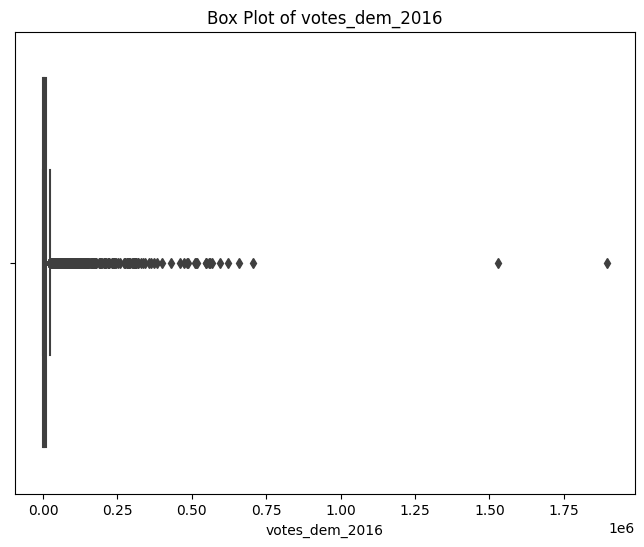

In [ ]:
# Create a box plot for to check for outliers in Democratic votes 2016
plt.figure(figsize=(8, 6))
sns.boxplot(x=data['votes_dem_2016'])
plt.title('Box Plot of votes_dem_2016')
plt.show()

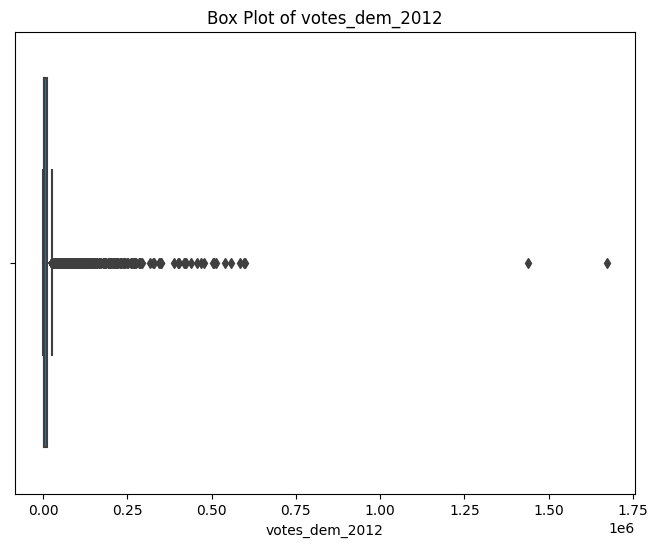

In [ ]:
# Create a box plot for to check for outliers in Democratic votes 2012
plt.figure(figsize=(8, 6))
sns.boxplot(x=data['votes_dem_2012'])
plt.title('Box Plot of votes_dem_2012')
plt.show()

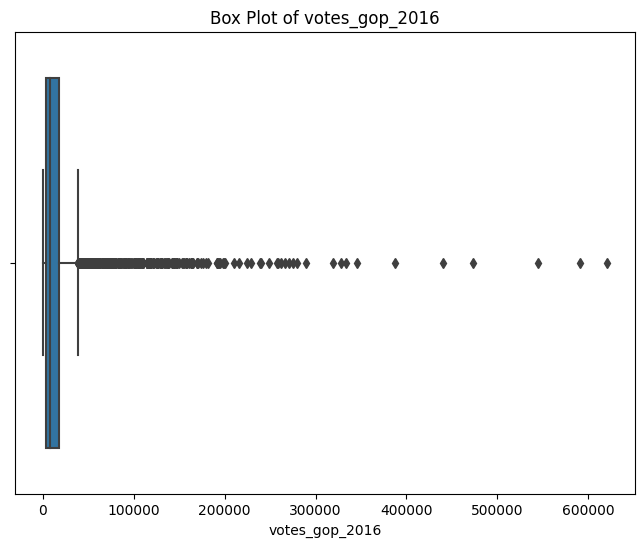

In [ ]:
# Box plot to check for outliers in Republican votes 2016
plt.figure(figsize=(8, 6))
sns.boxplot(x=data['votes_gop_2016'])
plt.title('Box Plot of votes_gop_2016')
plt.show()

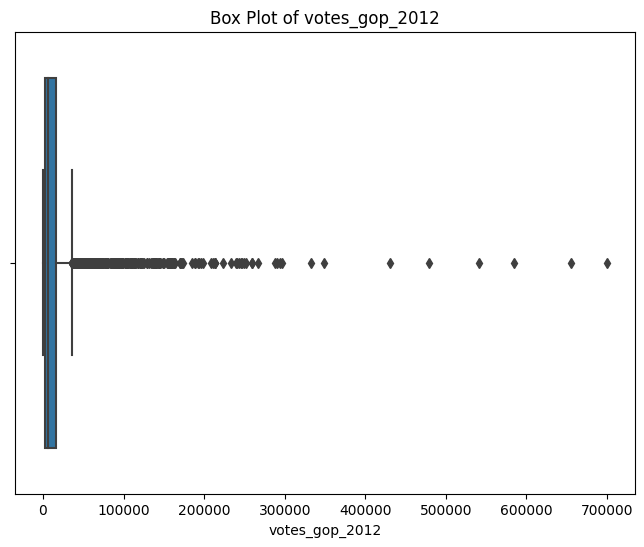

In [ ]:
# Box plot for to check for outliers in Republican votes 2012
plt.figure(figsize=(8, 6))
sns.boxplot(x=data['votes_gop_2012'])
plt.title('Box Plot of votes_gop_2012')
plt.show()

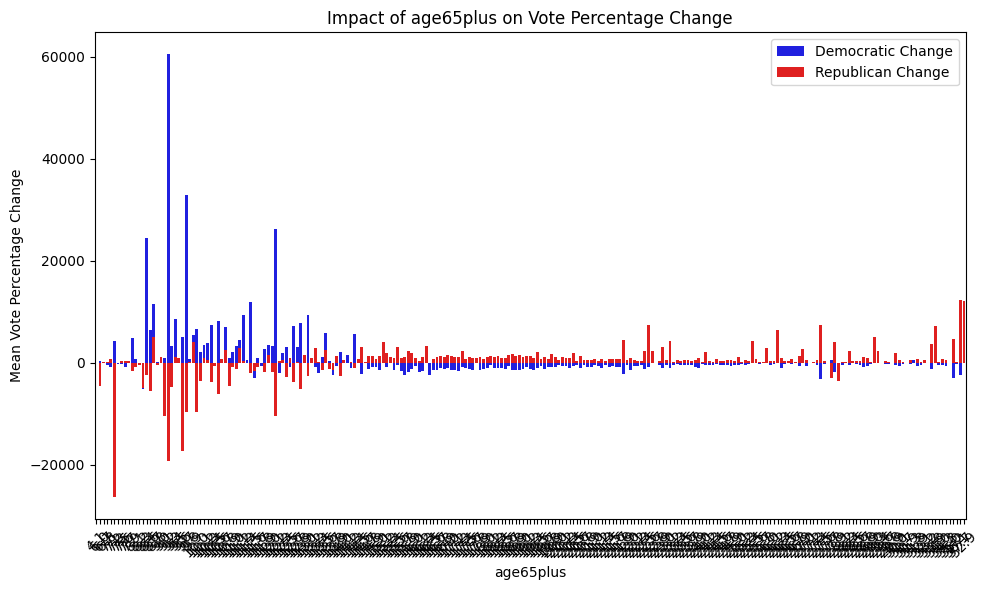

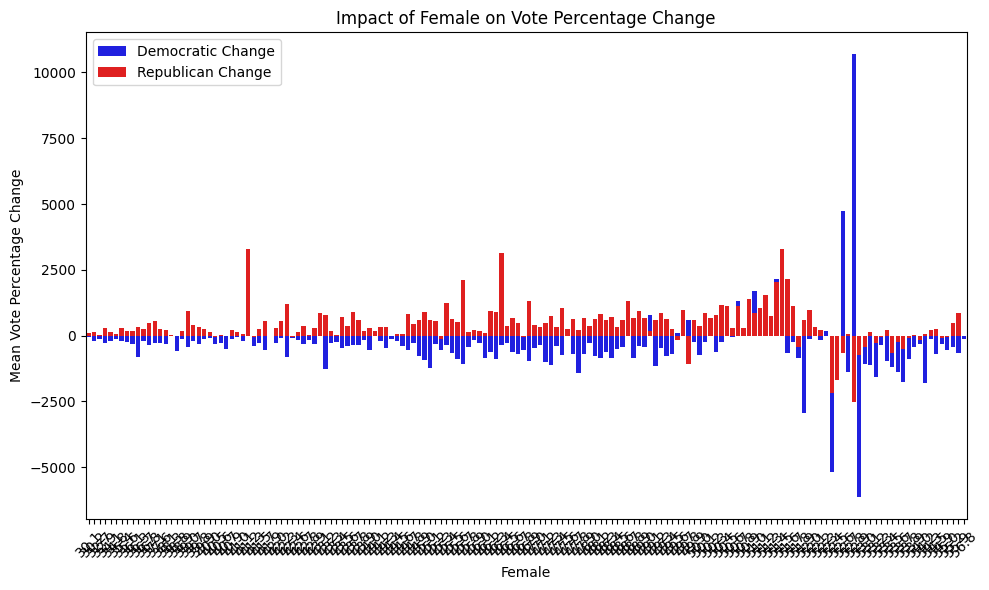

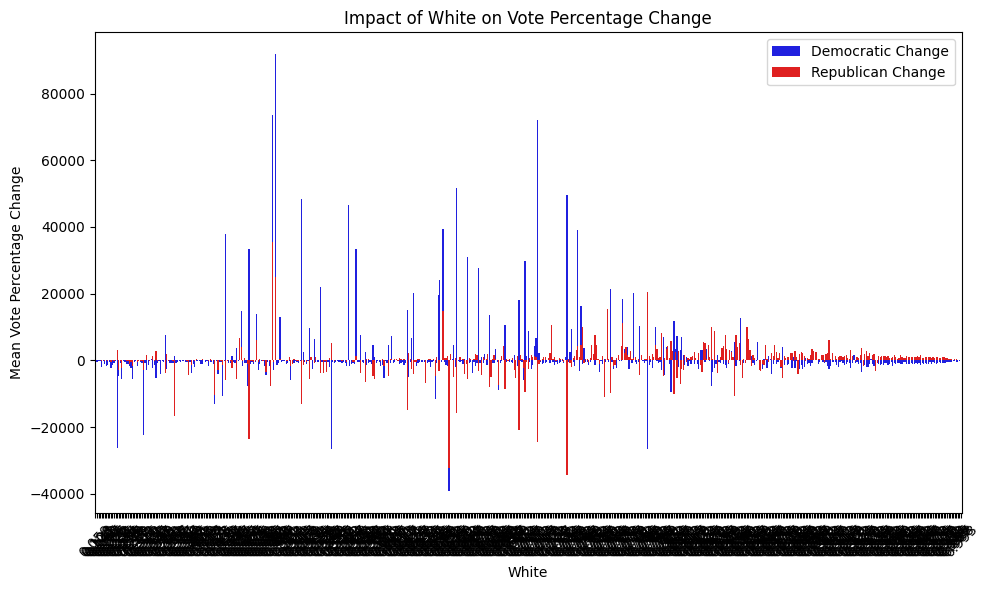

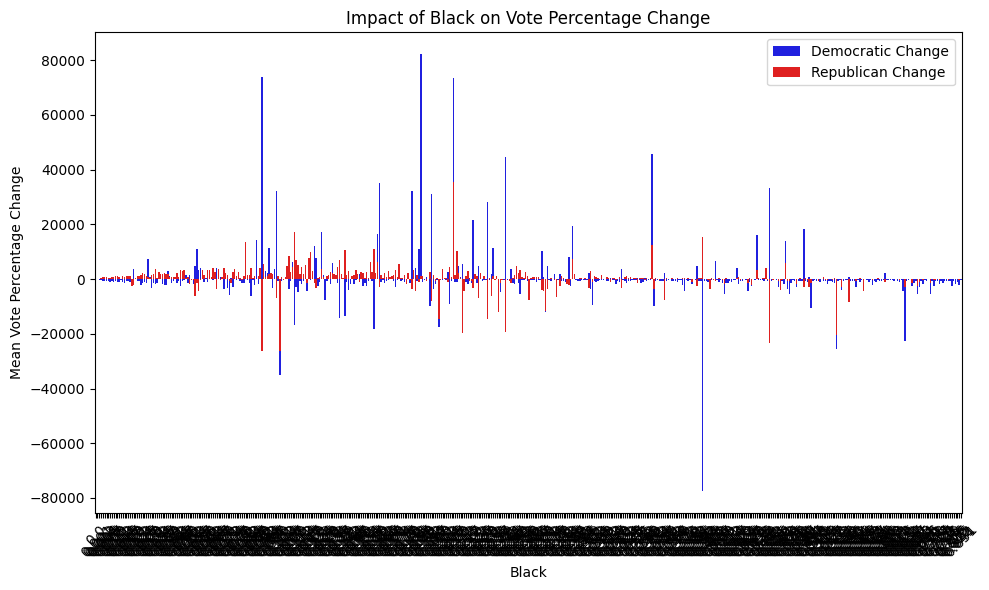

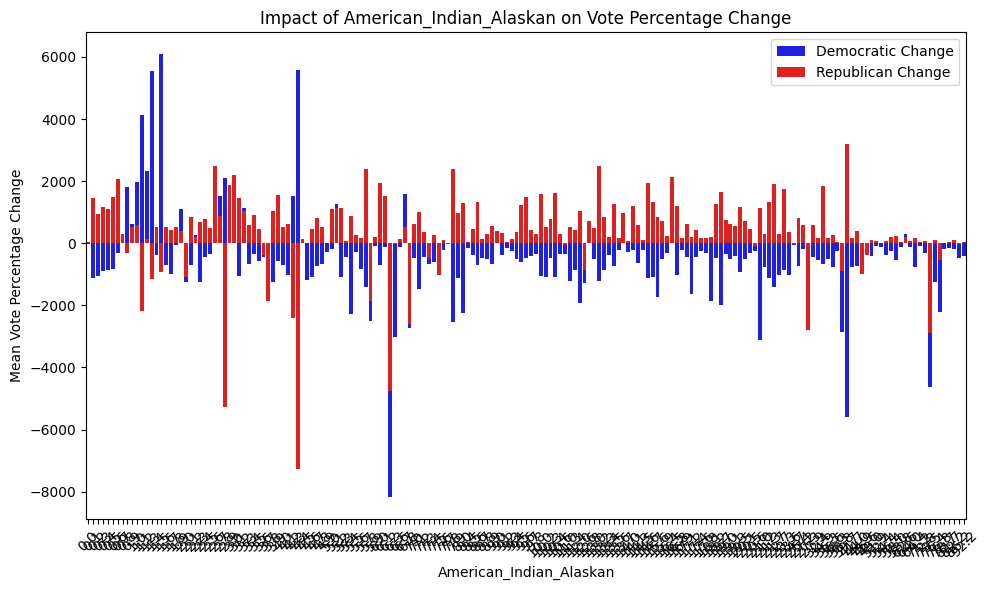

...

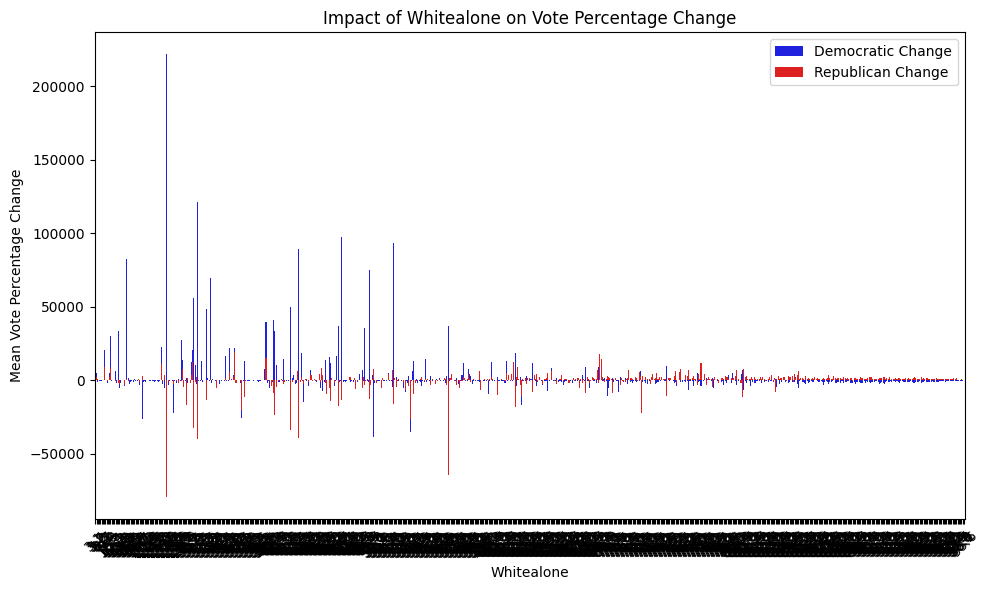

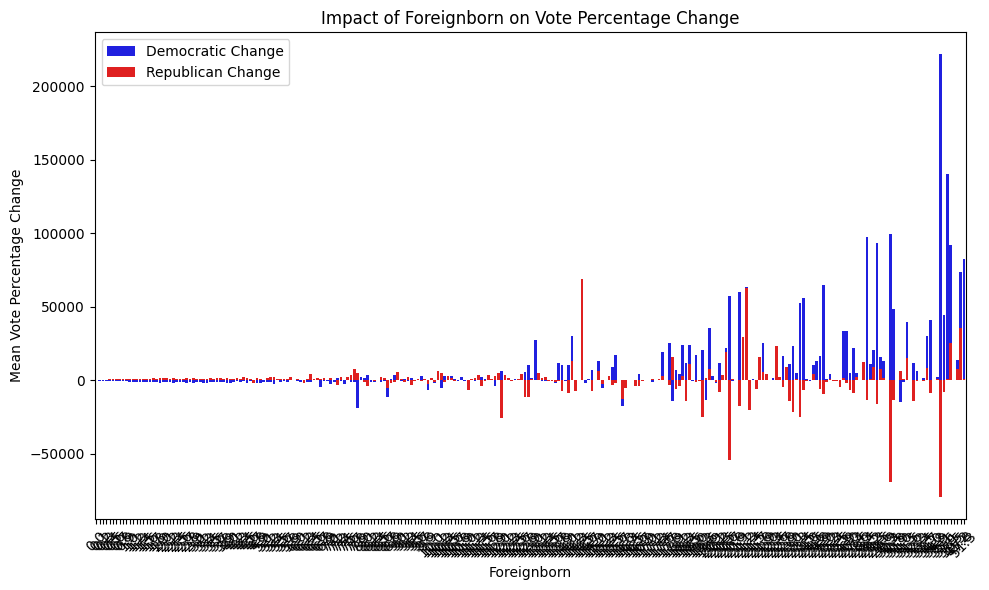

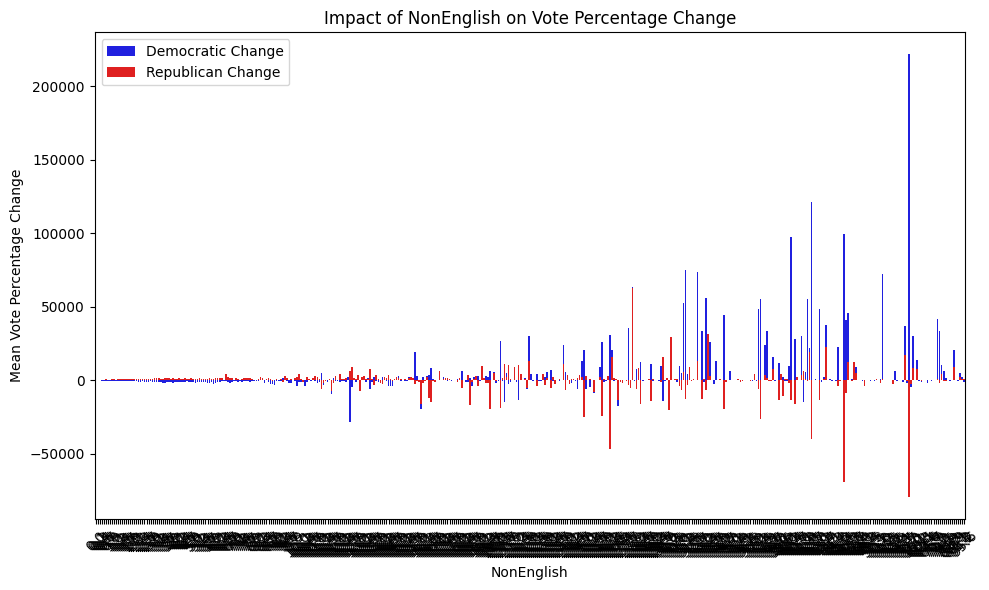

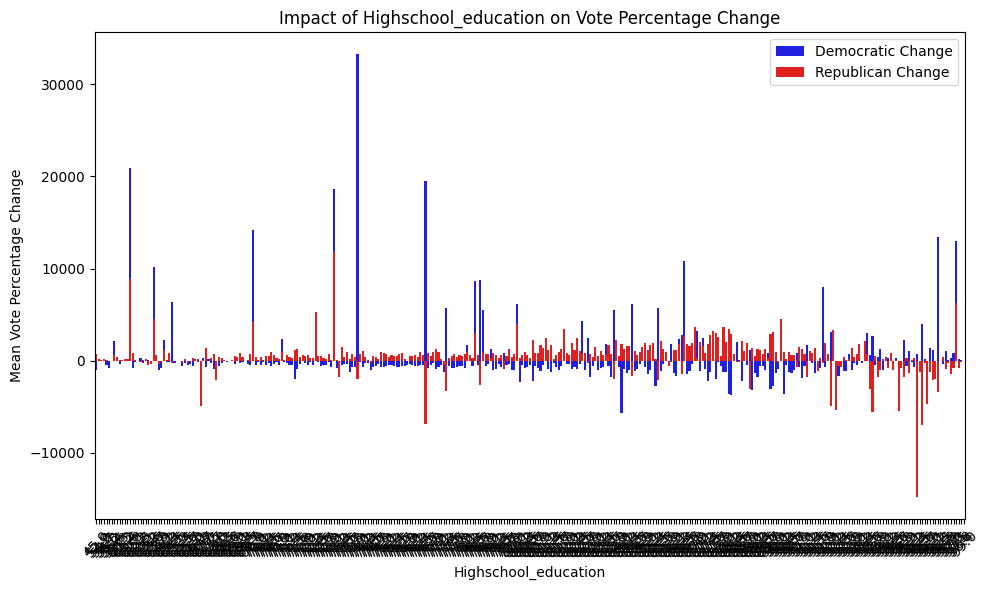

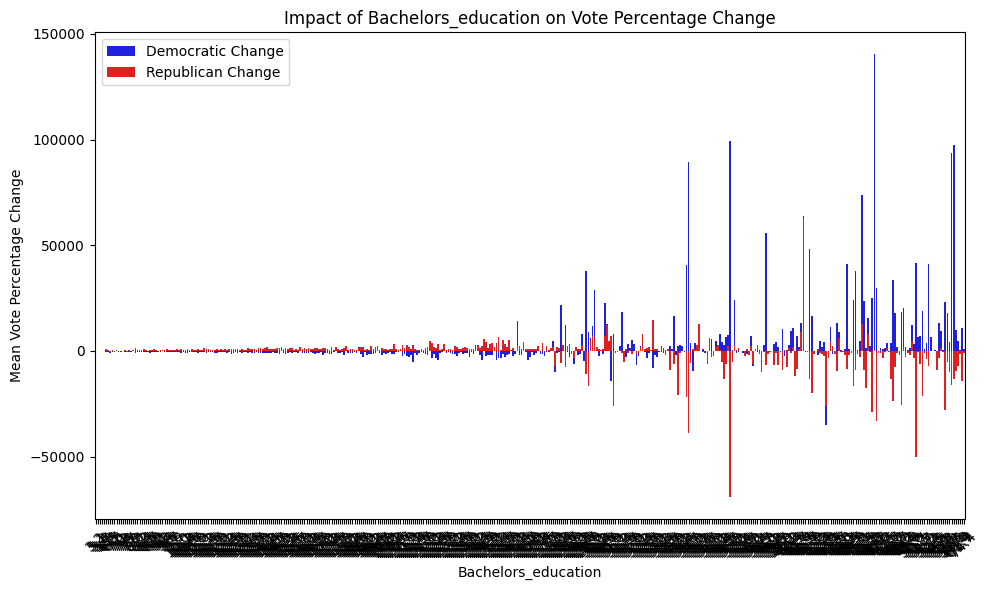

In [ ]:
# List of demographic factors for analysis
demographic_factors = ['age65plus', 'Female', 'White', 'Black', 'American_Indian_Alaskan', 'Asian', 'NativeHawian', 'Two_or_more_races', 'Hispanic', 'Whitealone', 'Foreignborn', 'NonEnglish', 'Highschool_education', 'Bachelors_education']

# Calculate the change in vote percentages for Democrats and Republicans between 2012 and 2016
data['dem_diff'] = data['votes_dem_2016'] - data['votes_dem_2012']
data['gop_diff'] = data['votes_gop_2016'] - data['votes_gop_2012']

# Loop through each demographic factor for analysis
for column in demographic_factors:
    # Group data by the demographic factor and calculate the mean change in vote percentages
    demographic_grouped = data.groupby(column)[['dem_diff', 'gop_diff']].mean()

    # Plotting
    plt.figure(figsize=(10, 6))
    sns.barplot(data=demographic_grouped.reset_index(), x=column, y='dem_diff', color='blue', label='Democratic Change')
    sns.barplot(data=demographic_grouped.reset_index(), x=column, y='gop_diff', color='red', label='Republican Change')
    plt.title(f'Impact of {column} on Vote Percentage Change')
    plt.xlabel(column)
    plt.ylabel('Mean Vote Percentage Change')
    plt.xticks(rotation=45)
    plt.legend()
    plt.tight_layout()
    plt.show()
    #Each bar represents the average change in vote percentages for Democrats (blue) and Republicans (red) within a specific demographic category. Here's how to interpret the visualization:



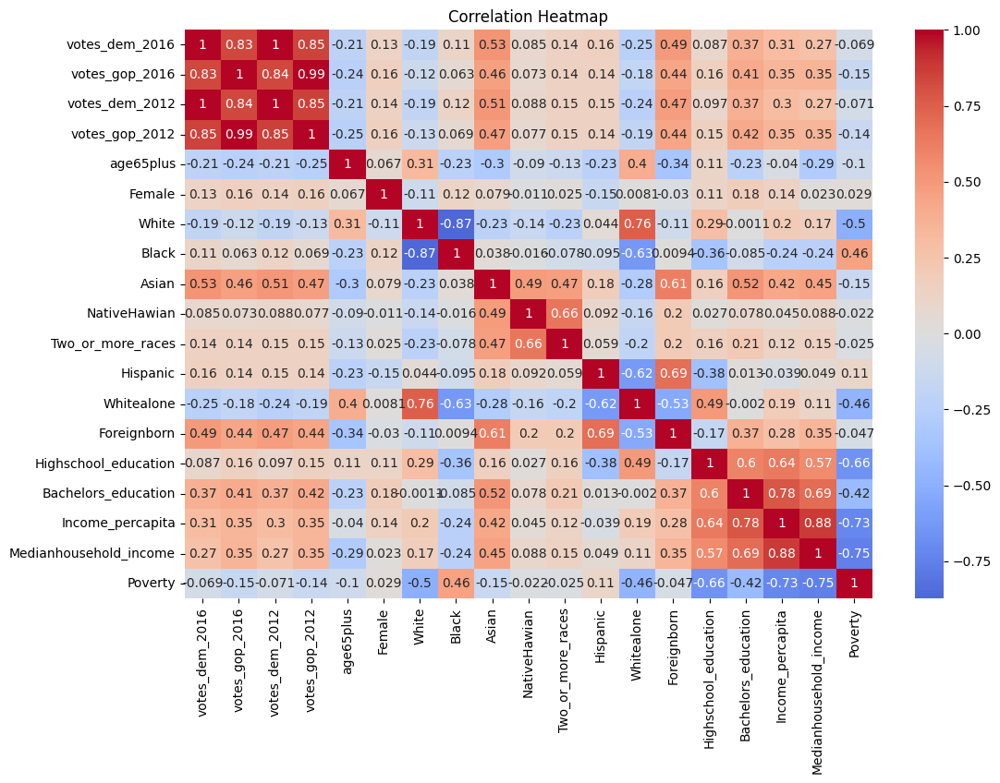

In [ ]:
# Select the relevant variables
selected_variables = ['votes_dem_2016', 'votes_gop_2016', 'votes_dem_2012', 'votes_gop_2012', 'age65plus',
                      'Female', 'White', 'Black', 'Asian', 'NativeHawian', 'Two_or_more_races', 'Hispanic',
                      'Whitealone', 'Foreignborn', 'Highschool_education', 'Bachelors_education',
                      'Income_percapita', 'Medianhousehold_income', 'Poverty']
selected_data = data[selected_variables]

# Calculate the correlation matrix
correlation_matrix = selected_data.corr()

# Plotting the correlation heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title('Correlation Heatmap')
plt.show()


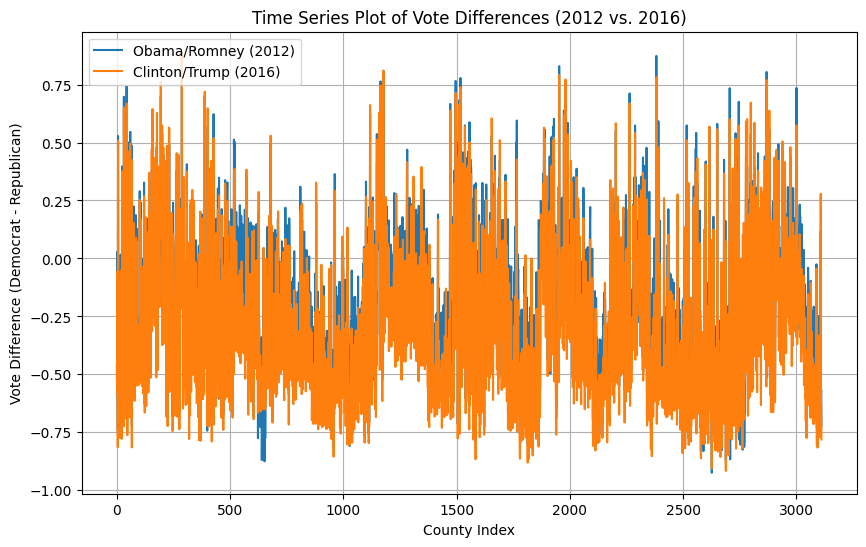

In [ ]:
# Calculate the differences in votes for Obama/Romney in 2012 and Trump/Clinton in 2016
vote_diff_2012 = data['Obama'] - data['Romney']
vote_diff_2016 = data['Clinton'] - data['Trump']

# Create a time series plot
plt.figure(figsize=(10, 6))
plt.plot(vote_diff_2012, label='Obama/Romney (2012)')
plt.plot(vote_diff_2016, label='Clinton/Trump (2016)')
plt.xlabel('County Index')
plt.ylabel('Vote Difference (Democrat - Republican)')
plt.title('Time Series Plot of Vote Differences (2012 vs. 2016)')
plt.legend()
plt.grid(True)
plt.show()


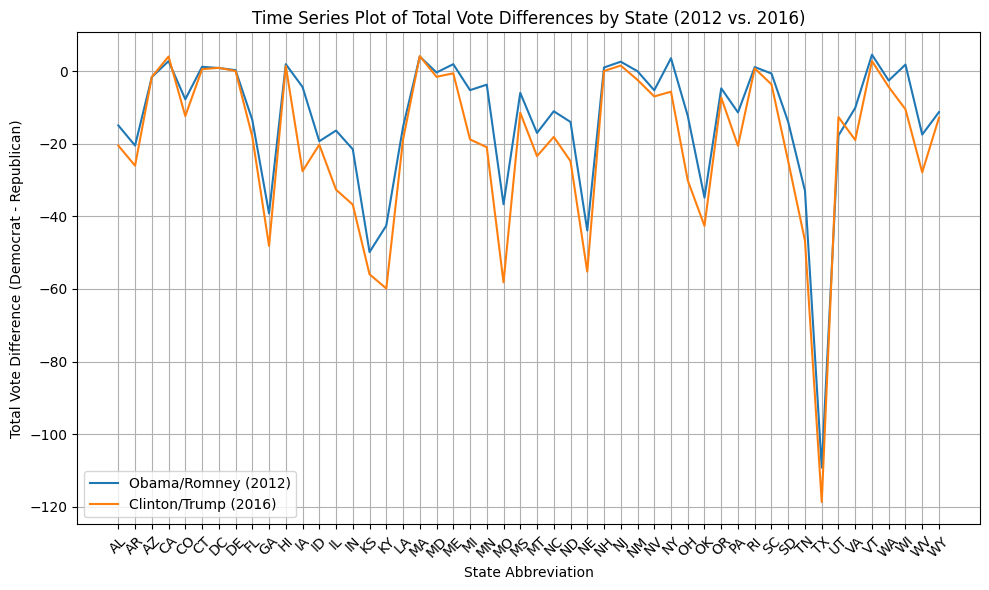

In [ ]:
# Calculate the total differences in votes for Obama/Romney in 2012 and Trump/Clinton in 2016 for each state
state_vote_diff_2012 = data.groupby('state_abbreviation')['Obama'].sum() - data.groupby('state_abbreviation')['Romney'].sum()
state_vote_diff_2016 = data.groupby('state_abbreviation')['Clinton'].sum() - data.groupby('state_abbreviation')['Trump'].sum()

# Create a time series plot
plt.figure(figsize=(10, 6))
plt.plot(state_vote_diff_2012, label='Obama/Romney (2012)')
plt.plot(state_vote_diff_2016, label='Clinton/Trump (2016)')
plt.xlabel('State Abbreviation')
plt.ylabel('Total Vote Difference (Democrat - Republican)')
plt.title('Time Series Plot of Total Vote Differences by State (2012 vs. 2016)')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


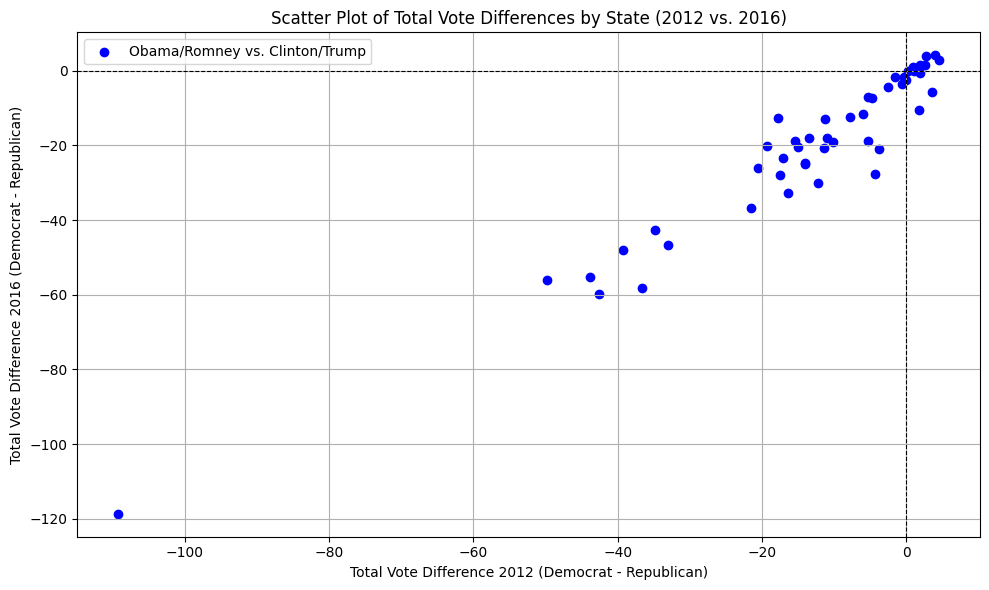

In [ ]:
# Calculate the total differences in votes for Obama/Romney in 2012 and Trump/Clinton in 2016 for each state
state_vote_diff_2012 = data.groupby('state_abbreviation')['Obama'].sum() - data.groupby('state_abbreviation')['Romney'].sum()
state_vote_diff_2016 = data.groupby('state_abbreviation')['Clinton'].sum() - data.groupby('state_abbreviation')['Trump'].sum()

# Create a scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(state_vote_diff_2012, state_vote_diff_2016, color='blue', label='Obama/Romney vs. Clinton/Trump')
plt.xlabel('Total Vote Difference 2012 (Democrat - Republican)')
plt.ylabel('Total Vote Difference 2016 (Democrat - Republican)')
plt.title('Scatter Plot of Total Vote Differences by State (2012 vs. 2016)')
plt.legend()
plt.grid(True)
plt.axhline(0, color='black', linestyle='--', linewidth=0.8)  # Add a horizontal line at y=0
plt.axvline(0, color='black', linestyle='--', linewidth=0.8)  # Add a vertical line at x=0
plt.tight_layout()
plt.show()


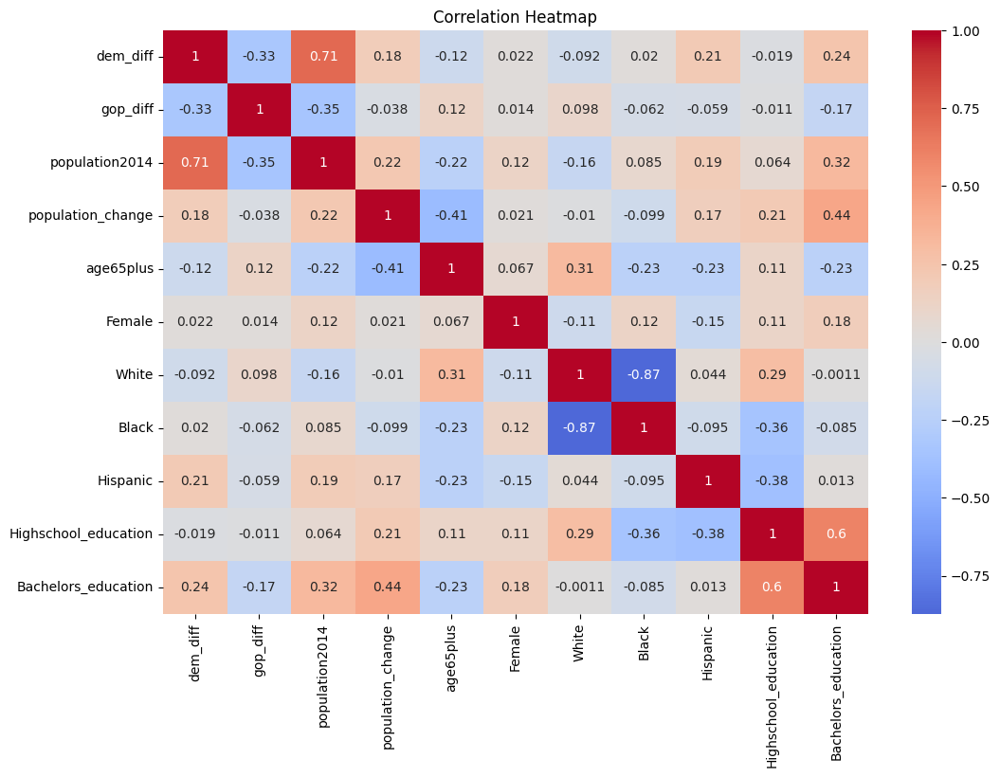

In [ ]:
#Correlation heatmap
# Calculate the change in vote percentages for Democrats and Republicans between 2012 and 2016
data['dem_diff'] = data['votes_dem_2016'] - data['votes_dem_2012']
data['gop_diff'] = data['votes_gop_2016'] - data['votes_gop_2012']

# Calculate the correlation matrix
correlation_matrix = data[['dem_diff', 'gop_diff', 'population2014', 'population_change', 'age65plus', 'Female', 'White', 'Black', 'Hispanic', 'Highschool_education', 'Bachelors_education']].corr()

# Plotting the correlation heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title('Correlation Heatmap')
plt.show()


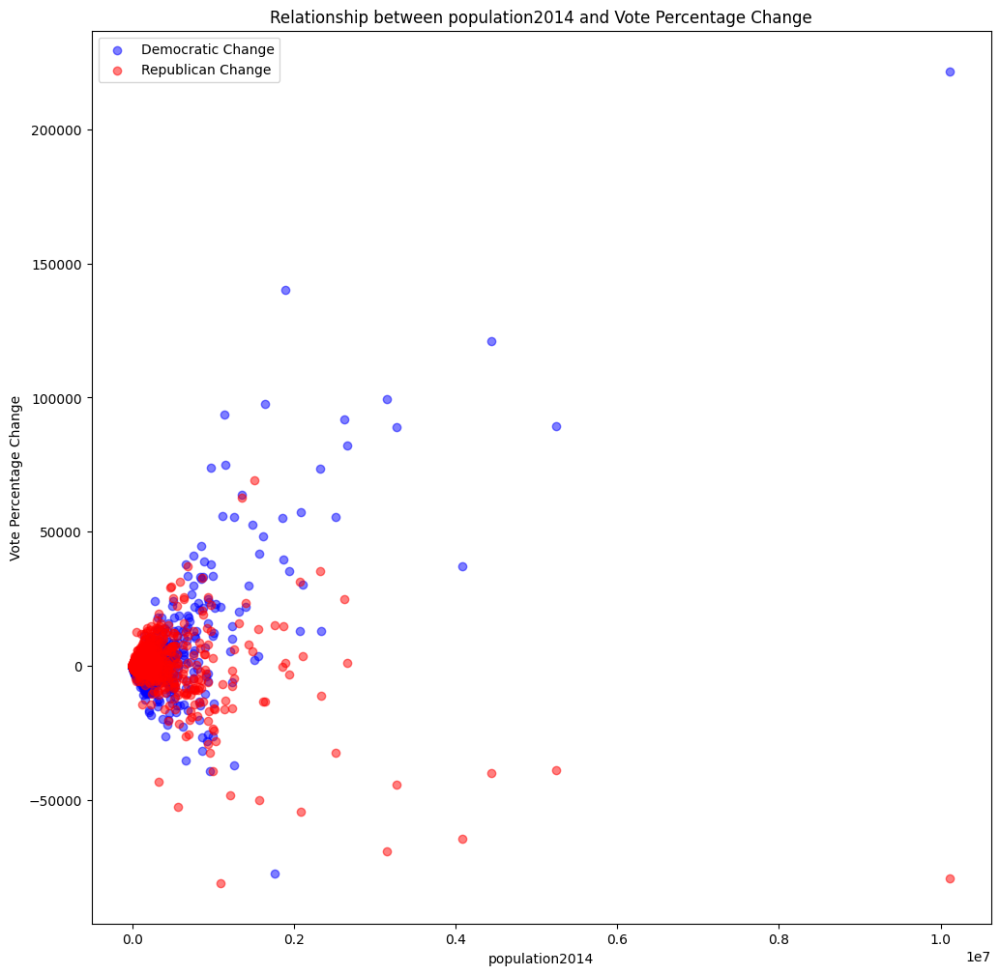

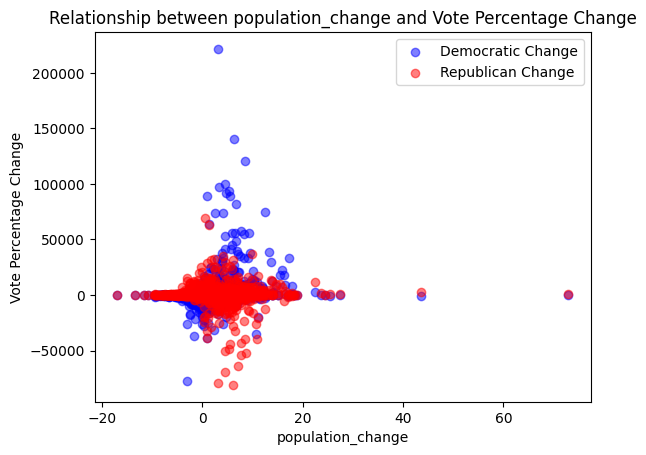

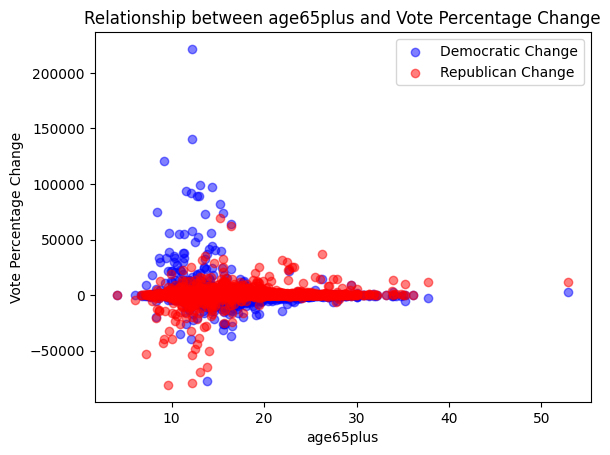

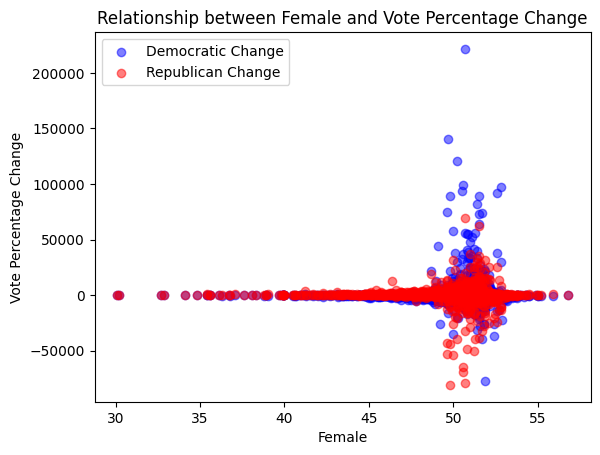

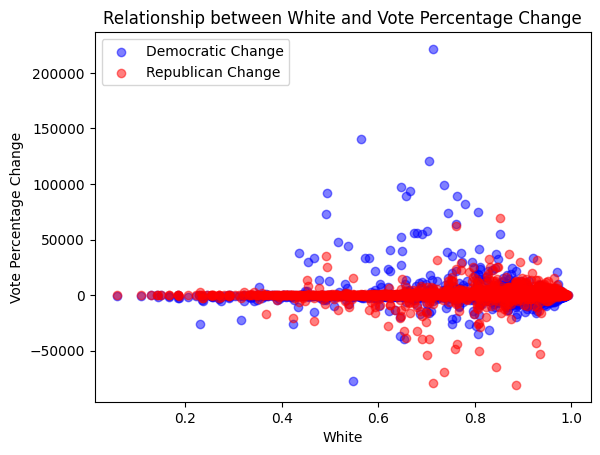

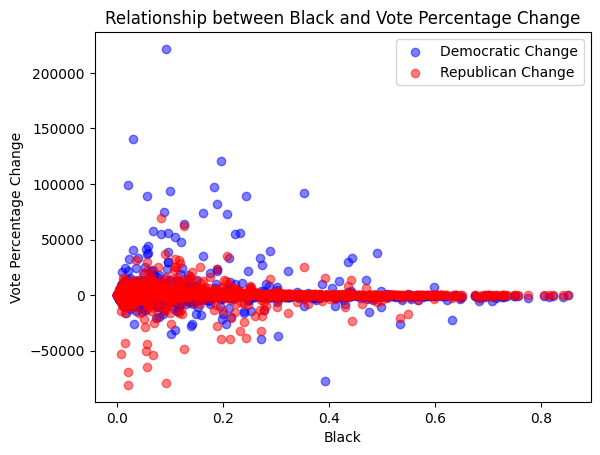

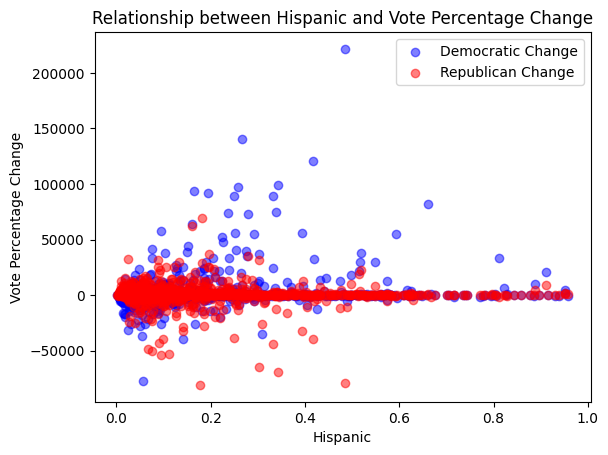

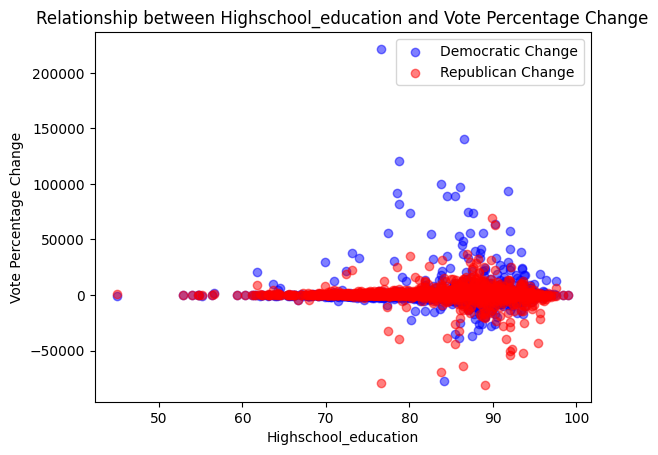

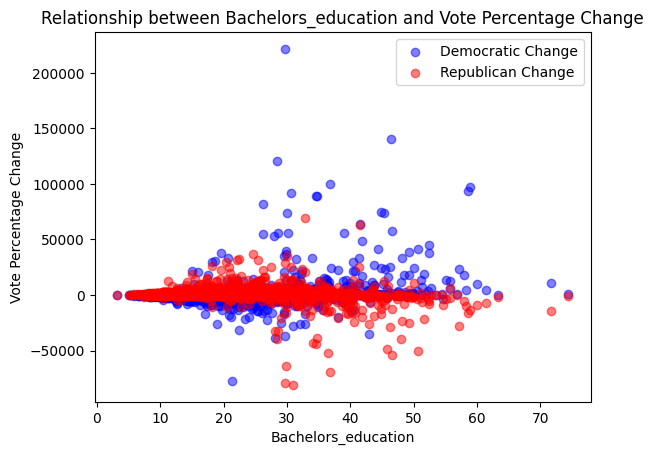

In [ ]:
# Calculate the differences in vote percentages for each candidate between 2012 and 2016
data['dem_diff'] = data['votes_dem_2016'] - data['votes_dem_2012']
data['gop_diff'] = data['votes_gop_2016'] - data['votes_gop_2012']

# Create scatter plots for demographic variables vs. differences in vote percentages
demographic_vars = ['population2014', 'population_change', 'age65plus', 'Female', 'White', 'Black', 'Hispanic', 'Highschool_education', 'Bachelors_education']
plt.figure(figsize=(12, 12))
for var in demographic_vars:
    plt.scatter(data[var], data['dem_diff'], color='blue', label='Democratic Change', alpha=0.5)
    plt.scatter(data[var], data['gop_diff'], color='red', label='Republican Change', alpha=0.5)
    plt.title(f'Relationship between {var} and Vote Percentage Change')
    plt.xlabel(var)
    plt.ylabel('Vote Percentage Change')
    plt.legend()
    plt.show()


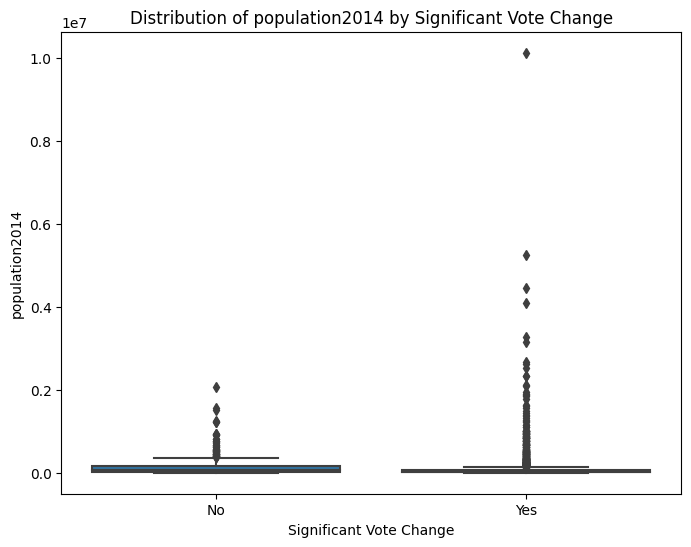

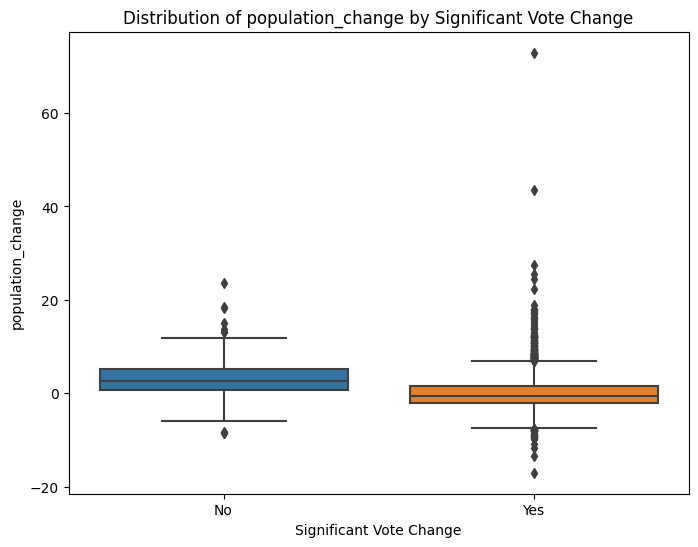

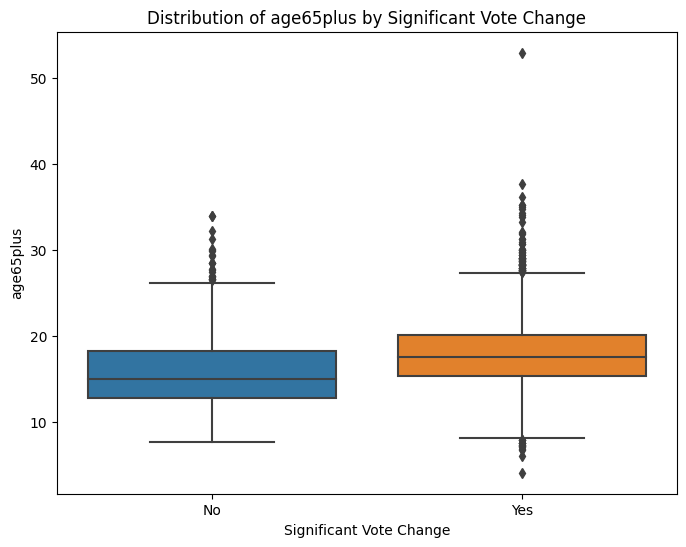

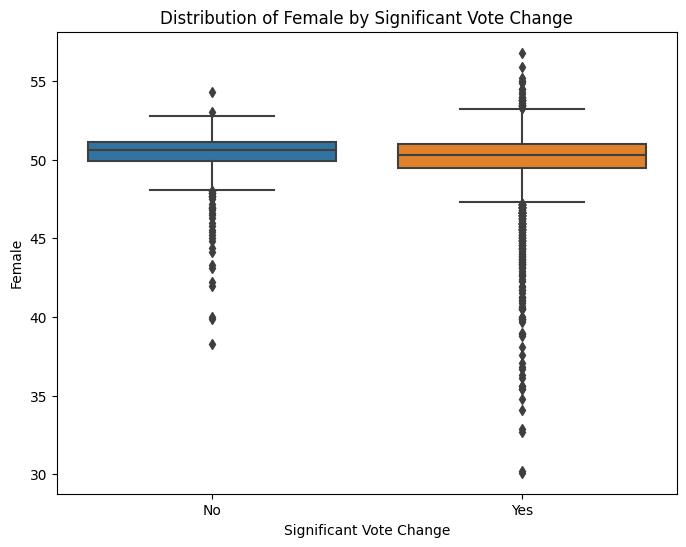

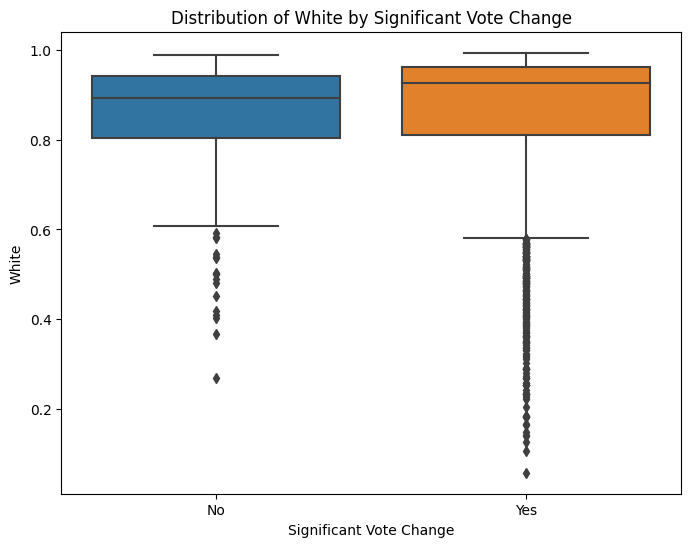

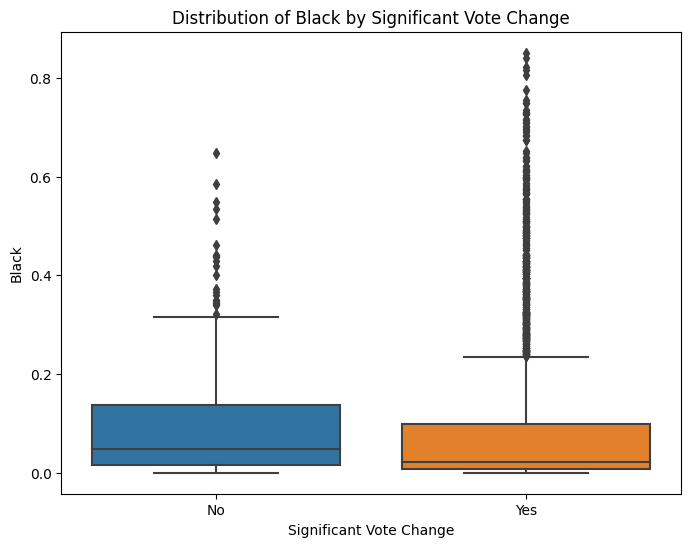

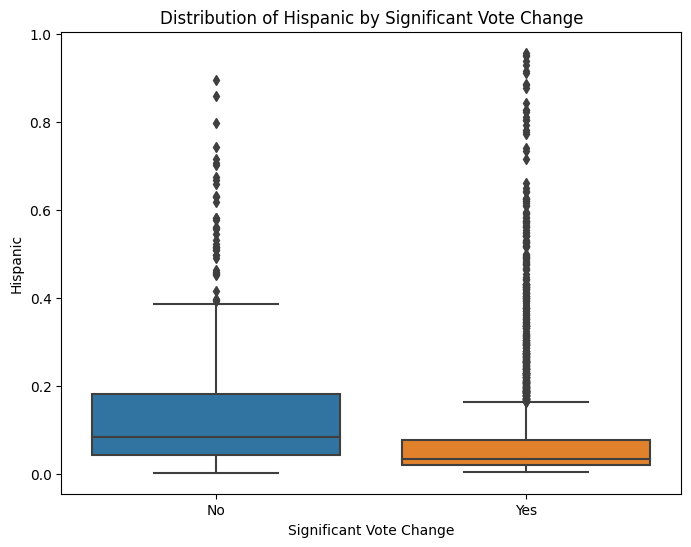

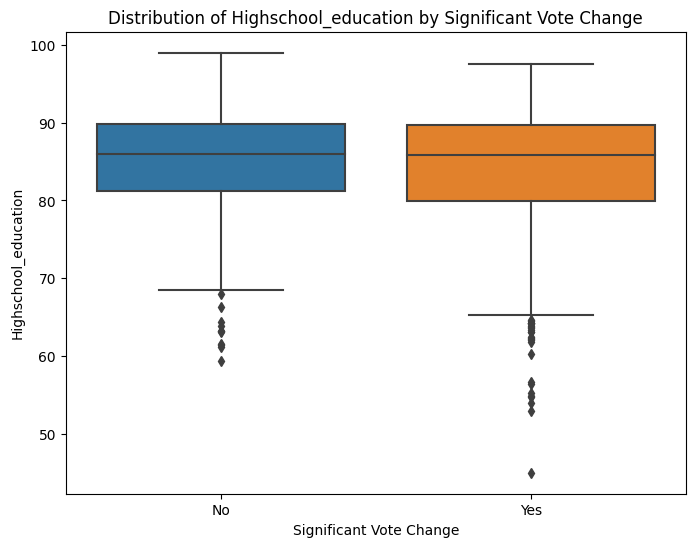

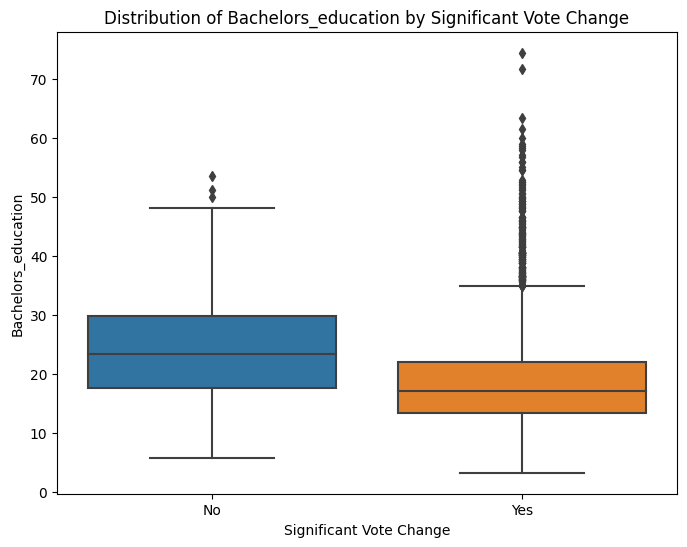

In [ ]:
# Calculate the differences in vote percentages for each candidate between 2012 and 2016
data['dem_diff'] = data['votes_dem_2016'] - data['votes_dem_2012']
data['gop_diff'] = data['votes_gop_2016'] - data['votes_gop_2012']

# Create a new column to categorize counties based on significant vote change
data['significant_change'] = ['Yes' if (abs(diff) >= 0.02 * total_votes_2016) else 'No' for diff, total_votes_2016 in zip(data['dem_diff'], data['total_votes_2016'])]

# Create box plots or violin plots for demographic variables by significant change
demographic_vars = ['population2014', 'population_change', 'age65plus', 'Female', 'White', 'Black', 'Hispanic', 'Highschool_education', 'Bachelors_education']
for var in demographic_vars:
    plt.figure(figsize=(8, 6))
    sns.boxplot(data=data, x='significant_change', y=var)
    plt.title(f'Distribution of {var} by Significant Vote Change')
    plt.xlabel('Significant Vote Change')
    plt.ylabel(var)
    plt.xticks(ticks=[0, 1], labels=['No', 'Yes'])
    plt.show()


In [ ]:
# Create a scatter plot
plt.figure(figsize=(10, 6))
sns.scatterplot(data=data, x='population2014', y='dem_diff', hue='Trump_Prediction', palette=['blue', 'red'], alpha=0.7)

# Set plot title and labels
plt.title('Scatter Plot of Population vs. Vote Percentage Difference (2016)')
plt.xlabel('Population (2014)')
plt.ylabel('Vote Percentage Difference (Democratic - Republican)')
plt.legend(title='Election Outcome')
plt.tight_layout()

# Show the plot
plt.show()


<ipython-input-18-5aa77644b3e5>:3: UserWarning: 
The palette list has fewer values (2) than needed (3112) and will cycle, which may produce an uninterpretable plot.
  sns.scatterplot(data=data, x='population2014', y='dem_diff', hue='Trump_Prediction', palette=['blue', 'red'], alpha=0.7)
<ipython-input-18-5aa77644b3e5>:10: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


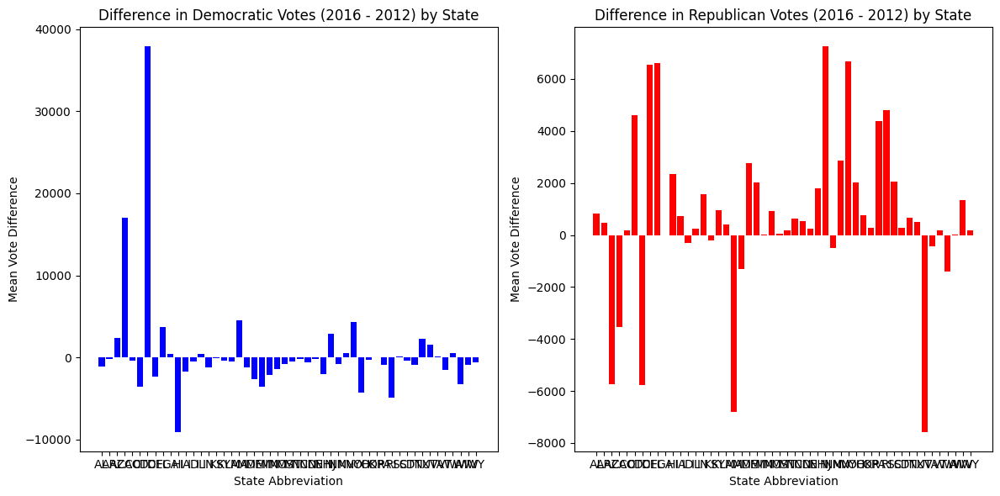

In [ ]:
# Calculate the difference in Dem and GOP votes between 2016 and 2012
data['dem_vote_diff'] = data['votes_dem_2016'] - data['votes_dem_2012']
data['gop_vote_diff'] = data['votes_gop_2016'] - data['votes_gop_2012']

# Group the data by state abbreviation and calculate the mean vote differences
state_vote_diff = data.groupby('state_abbreviation')[['dem_vote_diff', 'gop_vote_diff']].mean()

# Plotting
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.bar(state_vote_diff.index, state_vote_diff['dem_vote_diff'], color='blue')
plt.title('Difference in Democratic Votes (2016 - 2012) by State')
plt.xlabel('State Abbreviation')
plt.ylabel('Mean Vote Difference')

plt.subplot(1, 2, 2)
plt.bar(state_vote_diff.index, state_vote_diff['gop_vote_diff'], color='red')
plt.title('Difference in Republican Votes (2016 - 2012) by State')
plt.xlabel('State Abbreviation')
plt.ylabel('Mean Vote Difference')

plt.tight_layout()
plt.show()

In [ ]:
import plotly.express as px

In [ ]:
import pandas as pd
import plotly.express as px
import json
from urllib.request import urlopen  # Import the urlopen function

# Calculate the winner based on total votes for dem 2012 and total votes for gop 2012
data['winner'] = data.apply(lambda row: 1 if row['votes_dem_2012'] > row['votes_gop_2012'] else 0, axis=1)

# Load the geojson data for US counties
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)

# Create the choropleth map
fig = px.choropleth(
    data,
    geojson=counties,
    locations='fips',
    color='winner',
    color_continuous_scale=['red', 'blue'],
    hover_name='county_name',
    title='Winners by County 2012 (Democratic = Blue, Republican = Red)',
)

fig.update_geos(
    projection_type='albers usa',
    lakecolor='rgb(255, 255, 255)',
)

fig.show()


In [ ]:
# To calculate the winner based on total votes for dem 2012 and total votes for gop 2012
data['winner'] = data.apply(lambda row: 1 if row['votes_dem_2016'] > row['votes_gop_2016'] else 0, axis=1)

# Now you have a 'winner' column in your DataFrame that represents the winner in each county

In [ ]:
import plotly.express as px

In [ ]:
# Load the geojson data for US counties
import pandas as pd
import plotly.express as px
import json
from urllib.request import urlopen  # Import the urlopen function

# Calculate the winner based on total votes for dem 2012 and total votes for gop 2016
data['winner'] = data.apply(lambda row: 1 if row['votes_dem_2016'] > row['votes_gop_2016'] else 0, axis=1)

# Load the geojson data for US counties
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)

# Create the choropleth map
fig = px.choropleth(
    data,
    geojson=counties,
    locations='fips',
    color='winner',
    color_continuous_scale=['red', 'blue'],
    hover_name='county_name',
    title='Winners by County 2016 (Democratic = Blue, Republican = Red)',
)

fig.update_geos(
    projection_type='albers usa',
    lakecolor='rgb(255, 255, 255)',
)

fig.show()

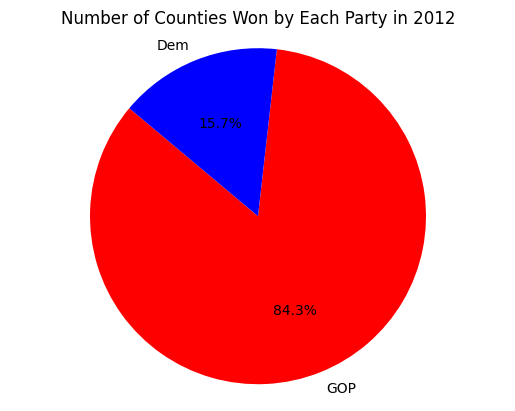

In [ ]:
# Count the number of counties won by each party in 2012
count_by_party = data['winner'].value_counts()

# Plot a pie chart
labels = ['GOP', 'Dem']
colors = ['red', 'blue']
plt.pie(count_by_party, labels=labels, colors=colors, autopct='%1.1f%%', startangle=140)
plt.title('Number of Counties Won by Each Party in 2012')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()

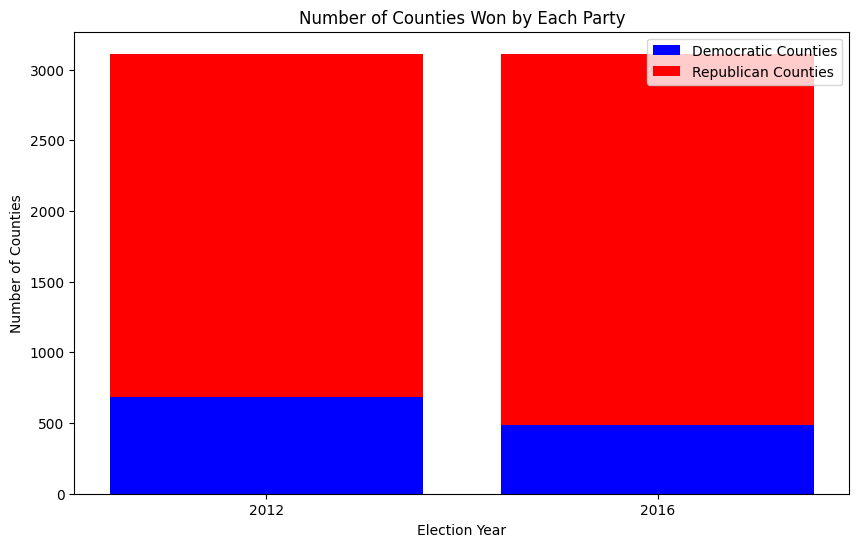

In [ ]:
import matplotlib.pyplot as plt

# List of election years
years = ['2012', '2016']

# Initialize lists to store the counts
count_dem = []
count_gop = []

# Loop through each year and calculate the counts
for year in years:
    # Calculate the number of counties won by each party
    count_dem.append(sum(data[f'votes_dem_{year}'] > data[f'votes_gop_{year}']))
    count_gop.append(sum(data[f'votes_gop_{year}'] > data[f'votes_dem_{year}']))

# Create a bar plot
plt.figure(figsize=(10, 6))
plt.bar(years, count_dem, color='blue', label='Democratic Counties')
plt.bar(years, count_gop, color='red', label='Republican Counties', bottom=count_dem)
plt.xlabel('Election Year')
plt.ylabel('Number of Counties')
plt.title('Number of Counties Won by Each Party')
plt.legend()
plt.show()

In [ ]:
# Calculate the winner of each county and the sum of their county wins
data['winner'] = data.apply(lambda row: 1 if row['votes_dem_2016'] > row['votes_gop_2016'] else 0, axis=1)

# Calculate the total number of counties won by each party
dem_counties_won = data[data['winner'] == 1]['winner'].count()
gop_counties_won = data[data['winner'] == 0]['winner'].count()

print(f"Total counties won by Democrats: {dem_counties_won}")
print(f"Total counties won by Republicans: {gop_counties_won}")


Total counties won by Democrats: 488
Total counties won by Republicans: 2624


In [ ]:
# Calculate the winner based on total votes for dem 2012 and total votes for gop 2016
data['winner'] = data.apply(lambda row: 1 if row['votes_dem_2012'] > row['votes_gop_2012'] else 0, axis=1)

# Calculate the total number of counties won by each party
dem_counties_won = data[data['winner'] == 1]['winner'].count()
gop_counties_won = data[data['winner'] == 0]['winner'].count()

print(f"Total counties won by Democrats: {dem_counties_won}")
print(f"Total counties won by Republicans: {gop_counties_won}")


Total counties won by Democrats: 686
Total counties won by Republicans: 2426


In [ ]:
#To create a list of states that voted for Democrats in descending order based on the number of counties won, you can use the following code:
# Group the data by state and sum the 'winner' column to count the number of counties won by Democrats
# Calculate the winner of each county and the sum of their county wins
data['winner'] = data.apply(lambda row: 1 if row['votes_dem_2016'] > row['votes_gop_2016'] else 0, axis=1)
state_dem_counties = data[data['winner'] == 1].groupby('state_abbreviation')['winner'].sum()

# Sort the states in descending order based on the number of counties won by Democrats
state_dem_counties_sorted = state_dem_counties.sort_values(ascending=False)

# Print the sorted list of states and the number of counties won
for state, counties_won in state_dem_counties_sorted.items():
    print(f"State: {state}, Counties Won by Democrats: {counties_won}")
#This code will calculate the number of counties won by Democrats in each state, sort the states in descending order based on the count, and then print the list of states along with the corresponding count of counties won by Democrats.

State: VA, Counties Won by Democrats: 40
State: CA, Counties Won by Democrats: 33
State: GA, Counties Won by Democrats: 31
State: TX, Counties Won by Democrats: 27
State: MS, Counties Won by Democrats: 26
State: NC, Counties Won by Democrats: 24
State: CO, Counties Won by Democrats: 23
State: NY, Counties Won by Democrats: 16
State: SC, Counties Won by Democrats: 15
State: MA, Counties Won by Democrats: 14
State: NM, Counties Won by Democrats: 14
State: WI, Counties Won by Democrats: 13
State: VT, Counties Won by Democrats: 13
State: AL, Counties Won by Democrats: 13
State: WA, Counties Won by Democrats: 12
State: NJ, Counties Won by Democrats: 12
State: PA, Counties Won by Democrats: 11
State: IL, Counties Won by Democrats: 11
State: LA, Counties Won by Democrats: 10
State: MN, Counties Won by Democrats: 9
State: FL, Counties Won by Democrats: 9
State: AR, Counties Won by Democrats: 8
State: OR, Counties Won by Democrats: 8
State: MI, Counties Won by Democrats: 8
State: OH, Counties W

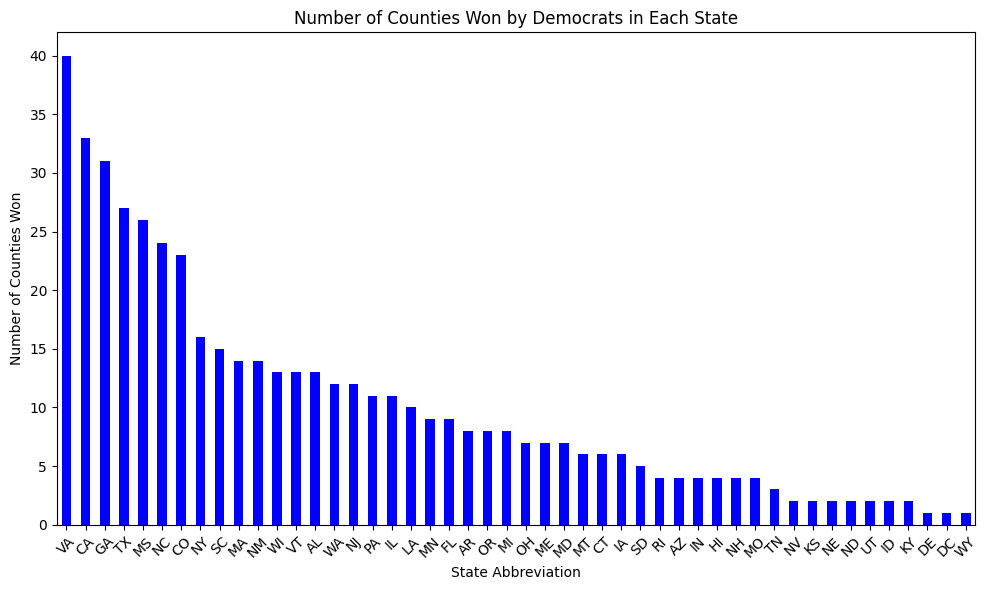

In [ ]:
# Group the data by state and sum the 'winner' column to count the number of counties won by Democrats
data['winner'] = data.apply(lambda row: 1 if row['votes_dem_2016'] > row['votes_gop_2016'] else 0, axis=1)
state_dem_counties = data[data['winner'] == 1].groupby('state_abbreviation')['winner'].sum()

# Sort the states in descending order based on the number of counties won by Democrats
state_dem_counties_sorted = state_dem_counties.sort_values(ascending=False)

# Plot the data as a bar plot
plt.figure(figsize=(10, 6))
state_dem_counties_sorted.plot(kind='bar', color='blue')
plt.title('Number of Counties Won by Democrats in Each State')
plt.xlabel('State Abbreviation')
plt.ylabel('Number of Counties Won')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

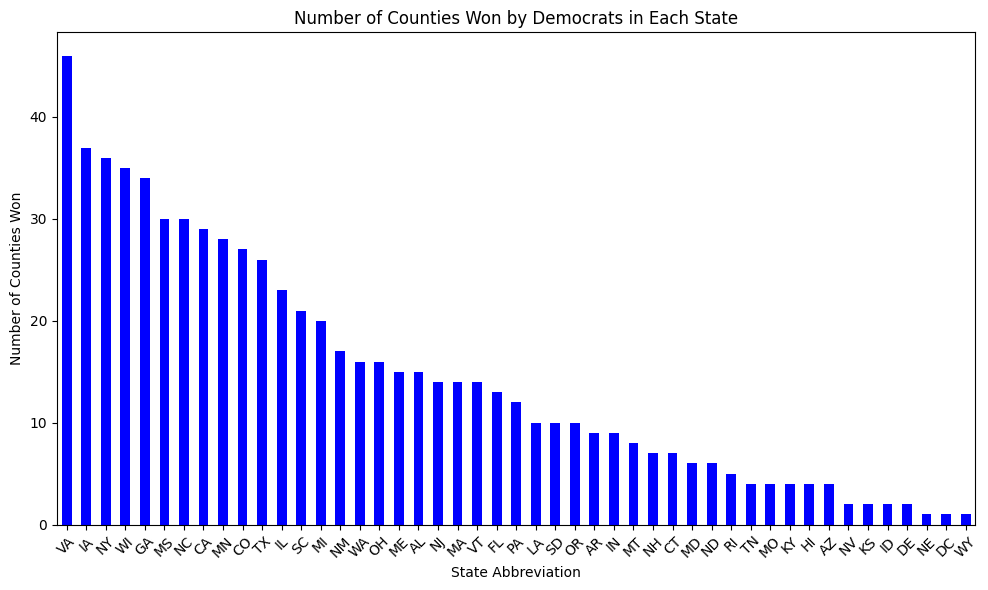

In [ ]:
import matplotlib.pyplot as plt

# Group the data by state and sum the 'winner' column to count the number of counties won by Democrats
data['winner'] = data.apply(lambda row: 1 if row['votes_dem_2012'] > row['votes_gop_2012'] else 0, axis=1)
state_dem_counties = data[data['winner'] == 1].groupby('state_abbreviation')['winner'].sum()

# Sort the states in descending order based on the number of counties won by Democrats
state_dem_counties_sorted = state_dem_counties.sort_values(ascending=False)

# Plot the data as a bar plot
plt.figure(figsize=(10, 6))
state_dem_counties_sorted.plot(kind='bar', color='blue')
plt.title('Number of Counties Won by Democrats in Each State')
plt.xlabel('State Abbreviation')
plt.ylabel('Number of Counties Won')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

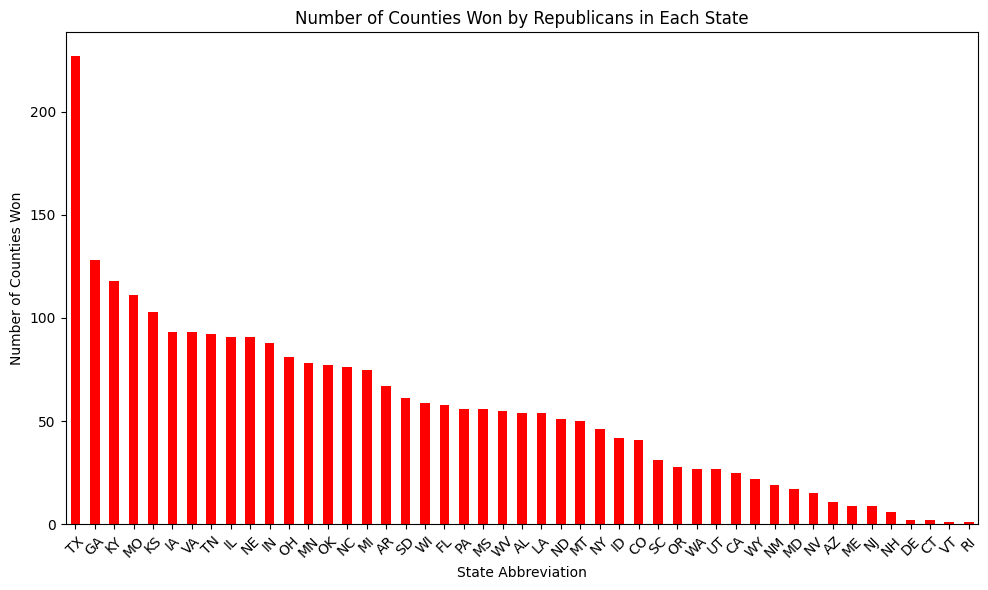

In [ ]:
# Group the data by state and sum the 'winner' column to count the number of counties won by Republicans
data['winner'] = data.apply(lambda row: 1 if row['votes_gop_2016'] > row['votes_dem_2016'] else 0, axis=1)
state_dem_counties = data[data['winner'] == 1].groupby('state_abbreviation')['winner'].sum()

# Sort the states in descending order based on the number of counties won by Democrats
state_dem_counties_sorted = state_dem_counties.sort_values(ascending=False)

# Plot the data as a bar plot
plt.figure(figsize=(10, 6))
state_dem_counties_sorted.plot(kind='bar', color='red')
plt.title('Number of Counties Won by Republicans in Each State')
plt.xlabel('State Abbreviation')
plt.ylabel('Number of Counties Won')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

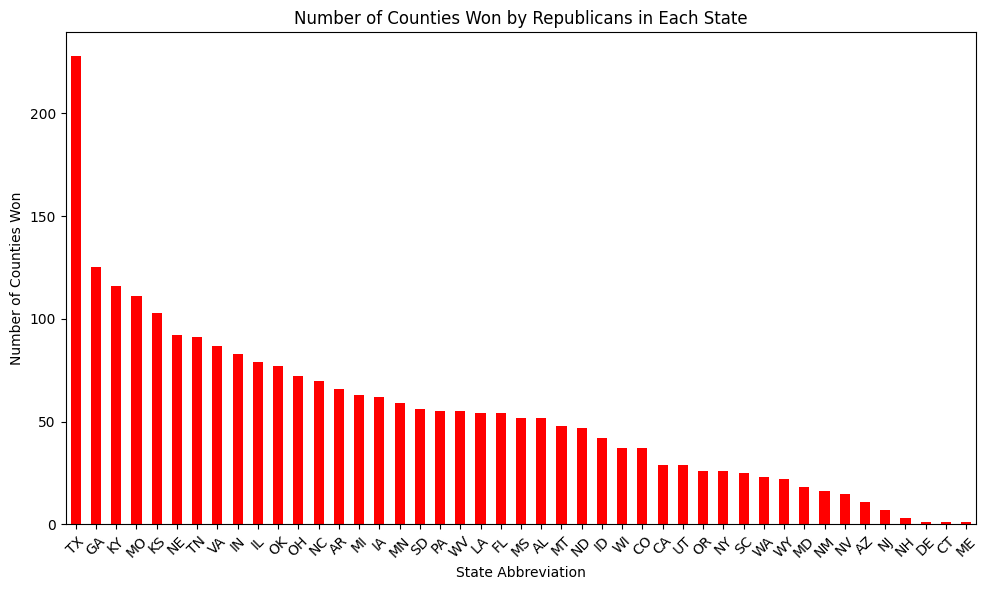

In [ ]:
# Group the data by state and sum the 'winner' column to count the number of counties won by Republicans
data['winner'] = data.apply(lambda row: 1 if row['votes_gop_2012'] > row['votes_dem_2012'] else 0, axis=1)
state_dem_counties = data[data['winner'] == 1].groupby('state_abbreviation')['winner'].sum()

# Sort the states in descending order based on the number of counties won by Democrats
state_dem_counties_sorted = state_dem_counties.sort_values(ascending=False)

# Plot the data as a bar plot
plt.figure(figsize=(10, 6))
state_dem_counties_sorted.plot(kind='bar', color='red')
plt.title('Number of Counties Won by Republicans in Each State')
plt.xlabel('State Abbreviation')
plt.ylabel('Number of Counties Won')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

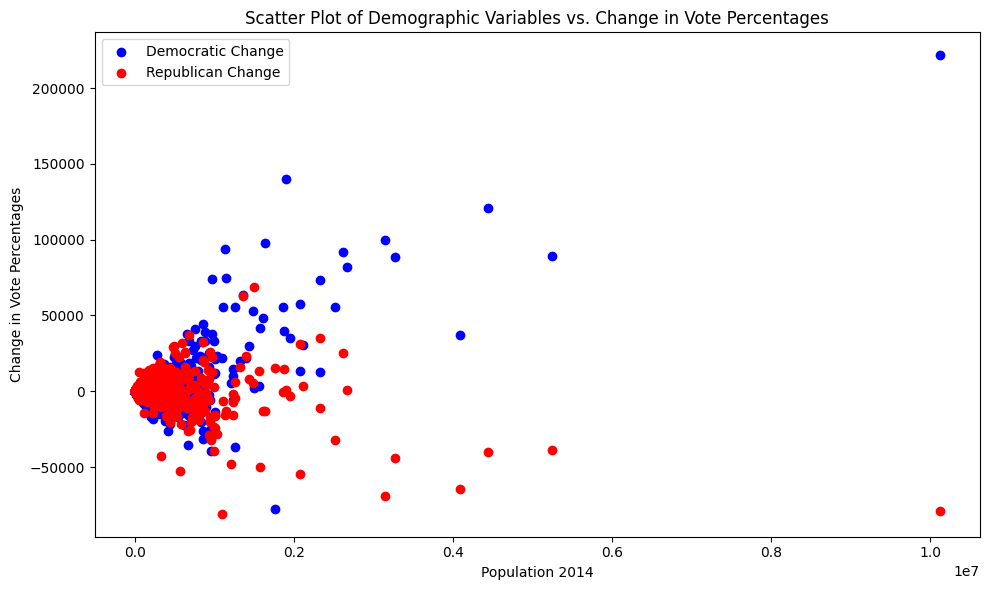

In [ ]:
import matplotlib.pyplot as plt

# Calculate the change in vote percentages for Democrats and Republicans
data['dem_diff'] = data['votes_dem_2016'] - data['votes_dem_2012']
data['gop_diff'] = data['votes_gop_2016'] - data['votes_gop_2012']

# Create a scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(data['population2014'], data['dem_diff'], color='blue', label='Democratic Change')
plt.scatter(data['population2014'], data['gop_diff'], color='red', label='Republican Change')
plt.title('Scatter Plot of Demographic Variables vs. Change in Vote Percentages')
plt.xlabel('Population 2014')
plt.ylabel('Change in Vote Percentages')
plt.legend()
plt.tight_layout()
plt.show()


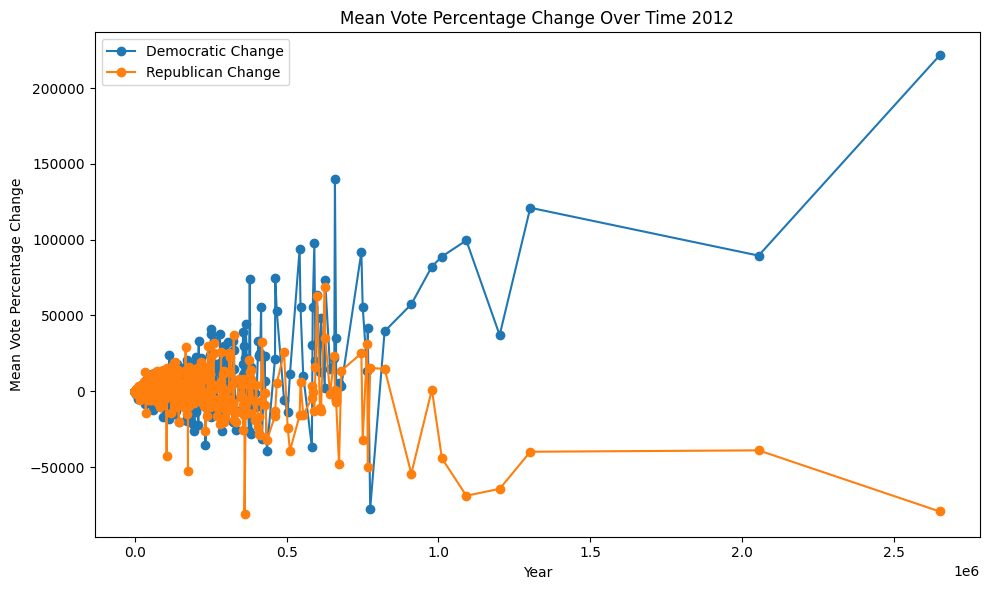

In [ ]:
# To Calculate the change in vote percentages for Democrats and Republicans
data['dem_diff'] = data['votes_dem_2016'] - data['votes_dem_2012']
data['gop_diff'] = data['votes_gop_2016'] - data['votes_gop_2012']

# Grouped data by year to calculate the mean change in vote percentages
yearly_grouped = data.groupby('total_votes_2016')[['dem_diff', 'gop_diff']].mean()

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(yearly_grouped.index, yearly_grouped['dem_diff'], marker='o', label='Democratic Change')
plt.plot(yearly_grouped.index, yearly_grouped['gop_diff'], marker='o', label='Republican Change')
plt.title('Mean Vote Percentage Change Over Time 2012')
plt.xlabel('Year')
plt.ylabel('Mean Vote Percentage Change')
plt.legend()
plt.tight_layout()
plt.show()

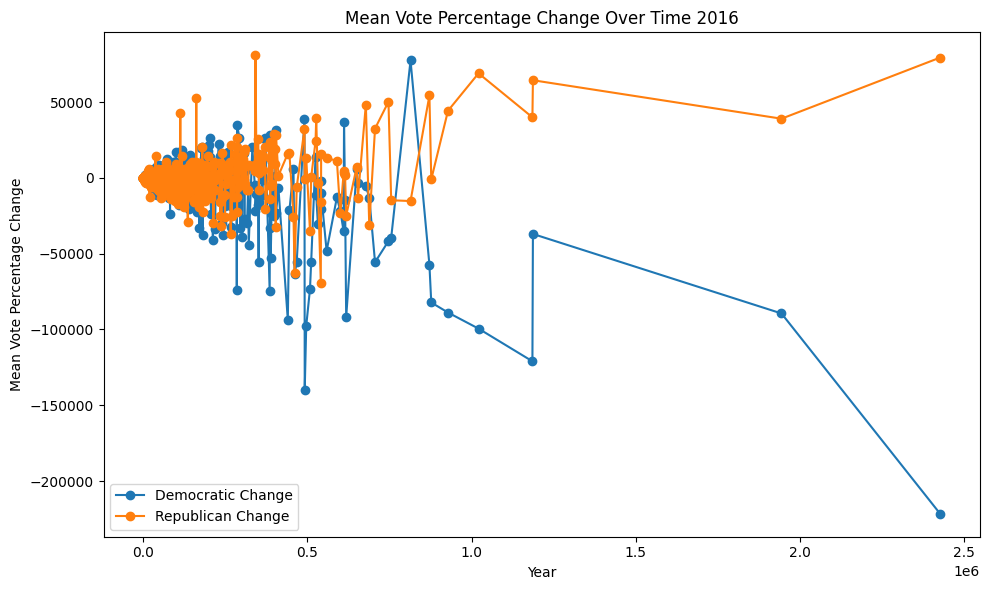

In [ ]:
# To calculate the change in vote percentages for Democrats and Republicans
data['dem_diff'] = data['votes_dem_2012'] - data['votes_dem_2016']
data['gop_diff'] = data['votes_gop_2012'] - data['votes_gop_2016']

# Grouped data by year and calculate the mean change in vote percentages
yearly_grouped = data.groupby('total_votes_2012')[['dem_diff', 'gop_diff']].mean()

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(yearly_grouped.index, yearly_grouped['dem_diff'], marker='o', label='Democratic Change')
plt.plot(yearly_grouped.index, yearly_grouped['gop_diff'], marker='o', label='Republican Change')
plt.title('Mean Vote Percentage Change Over Time 2016')
plt.xlabel('Year')
plt.ylabel('Mean Vote Percentage Change')
plt.legend()
plt.tight_layout()
plt.show()

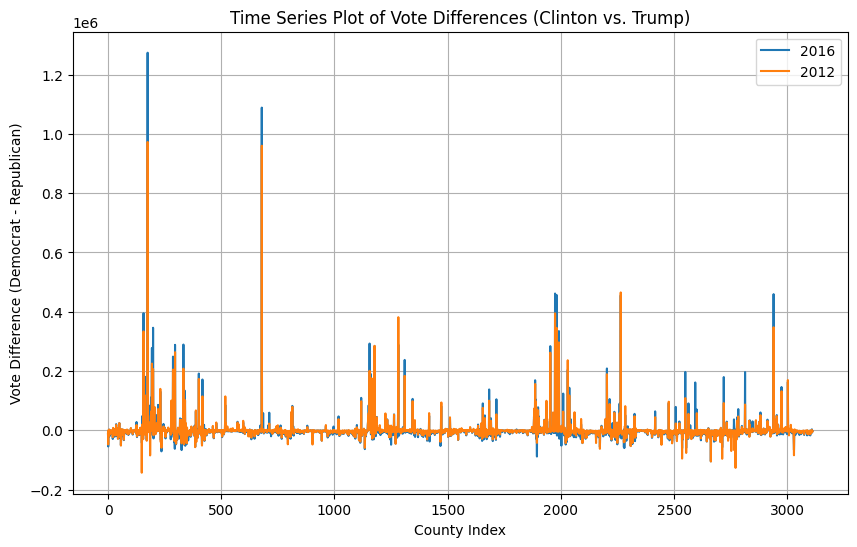

In [ ]:
# Create a time series plot for the differences in Clinton's and Trump's votes
plt.figure(figsize=(10, 6))
plt.plot(data['votes_dem_2016'] - data['votes_gop_2016'], label='2016')
plt.plot(data['votes_dem_2012'] - data['votes_gop_2012'], label='2012')
plt.xlabel('County Index')
plt.ylabel('Vote Difference (Democrat - Republican)')
plt.title('Time Series Plot of Vote Differences (Clinton vs. Trump)')
plt.legend()
plt.grid(True)
plt.show()

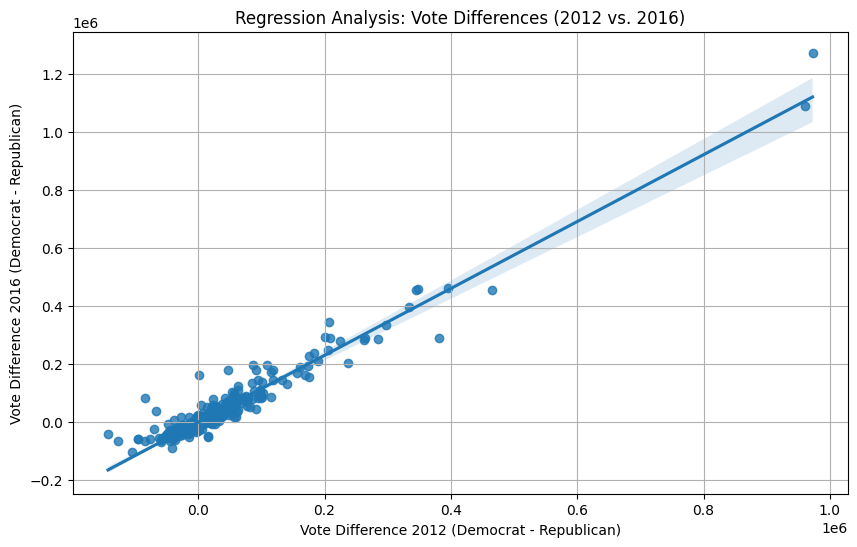

In [ ]:
# Create a scatter plot with regression line
plt.figure(figsize=(10, 6))
sns.regplot(x=data['votes_dem_2012'] - data['votes_gop_2012'], y=data['votes_dem_2016'] - data['votes_gop_2016'])
plt.xlabel('Vote Difference 2012 (Democrat - Republican)')
plt.ylabel('Vote Difference 2016 (Democrat - Republican)')
plt.title('Regression Analysis: Vote Differences (2012 vs. 2016)')
plt.grid(True)
plt.show()